In [39]:
!pip install lime
!pip install pillow
!pip install requests

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


In [40]:
import os
import itertools

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.applications import EfficientNetB3
from keras.applications import VGG16

In [41]:
def loading_the_data(data_dir):
    filepaths = []
    labels = []

    folds = os.listdir(data_dir)

    for fold in folds:
        foldpath = os.path.join(data_dir, fold)
        filelist = os.listdir(foldpath)
        for file in filelist:
            fpath = os.path.join(foldpath, file)

            filepaths.append(fpath)
            labels.append(fold)

    Fseries = pd.Series(filepaths, name='filepaths')
    Lseries = pd.Series(labels, name='labels')

    df = pd.concat([Fseries, Lseries], axis=1)

    return df

In [42]:
data_dir = '/kaggle/input/diabetic-foot-ulcer-dfu/DFU/Patches'
df = loading_the_data(data_dir)

df

,filepaths,labels
0,/kaggle/input/diabetic-foot-ulcer-dfu/DFU/Patc...,Normal(Healthy skin)
1,/kaggle/input/diabetic-foot-ulcer-dfu/DFU/Patc...,Normal(Healthy skin)
2,/kaggle/input/diabetic-foot-ulcer-dfu/DFU/Patc...,Normal(Healthy skin)
3,/kaggle/input/diabetic-foot-ulcer-dfu/DFU/Patc...,Normal(Healthy skin)
4,/kaggle/input/diabetic-foot-ulcer-dfu/DFU/Patc...,Normal(Healthy skin)
...,...,...
1050,/kaggle/input/diabetic-foot-ulcer-dfu/DFU/Patc...,Abnormal(Ulcer)
1051,/kaggle/input/diabetic-foot-ulcer-dfu/DFU/Patc...,Abnormal(Ulcer)
1052,/kaggle/input/diabetic-foot-ulcer-dfu/DFU/Patc...,Abnormal(Ulcer)
1053,/kaggle/input/diabetic-foot-ulcer-dfu/DFU/Patc...,Abnormal(Ulcer)


In [43]:
data_balance = df.labels.value_counts()


data_balance

labels
Normal(Healthy skin)    543
Abnormal(Ulcer)         512
Name: count, dtype: int64

In [44]:
train_df, temp_df = train_test_split(df, train_size=0.7, shuffle=True, random_state=42)


test_df, valid_df = train_test_split(temp_df, test_size=1/3, shuffle=True, random_state=42)

In [45]:
batch_size = 16
img_size = (224, 224)

tr_gen = ImageDataGenerator(rescale=1. / 255)
ts_gen = ImageDataGenerator(rescale=1. / 255)


train_gen = tr_gen.flow_from_dataframe( train_df, x_col= 'filepaths', y_col= 'labels', target_size= img_size, class_mode= 'categorical',
                                    color_mode= 'rgb', shuffle= True, batch_size= batch_size)

valid_gen = ts_gen.flow_from_dataframe( valid_df, x_col= 'filepaths', y_col= 'labels', target_size= img_size, class_mode= 'categorical',
                                    color_mode= 'rgb', shuffle= True, batch_size= batch_size)

test_gen = ts_gen.flow_from_dataframe( test_df, x_col= 'filepaths', y_col= 'labels', target_size= img_size, class_mode= 'categorical',
                                    color_mode= 'rgb', shuffle= False, batch_size= batch_size)


Found 738 validated image filenames belonging to 2 classes.
Found 106 validated image filenames belonging to 2 classes.
Found 211 validated image filenames belonging to 2 classes.


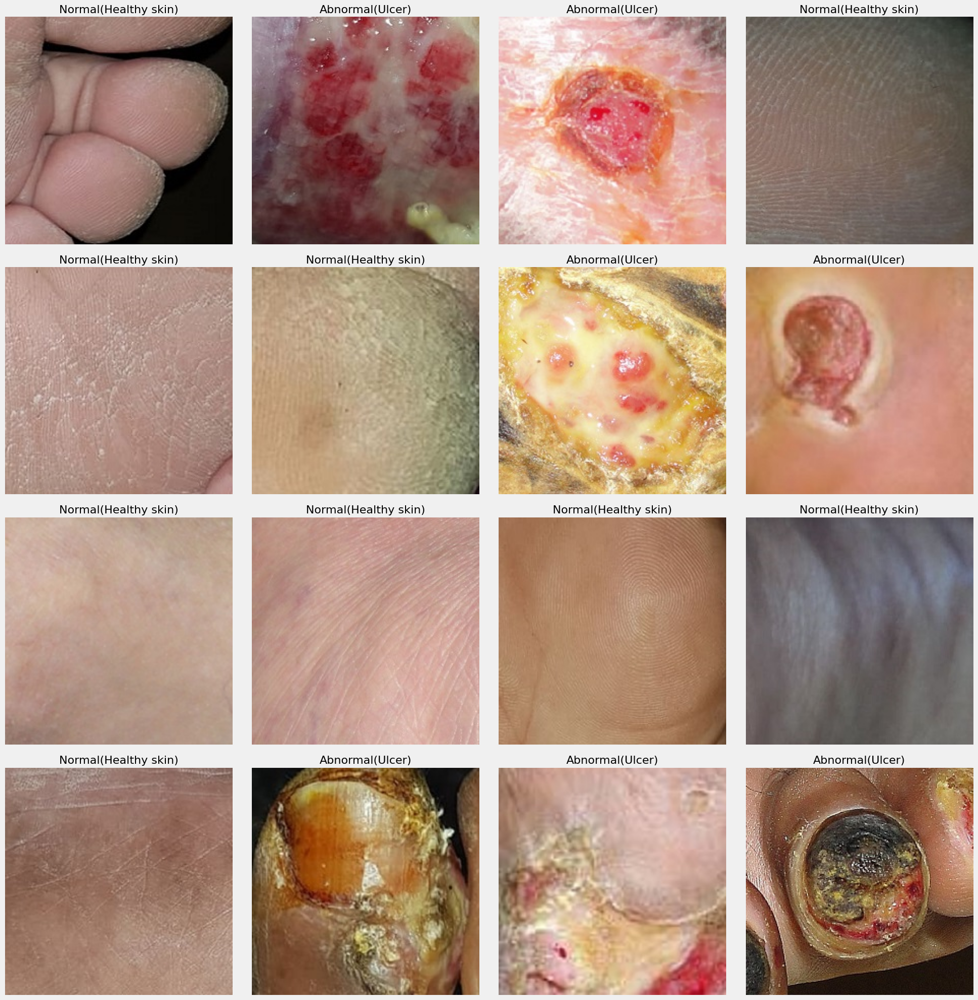

In [46]:
g_dict = train_gen.class_indices
classes = list(g_dict.keys())
images, labels = next(train_gen)

plt.figure(figsize= (20, 20))

for i in range(batch_size):
    plt.subplot(4, 4, i + 1)
    image = images[i]
    plt.imshow(image)
    index = np.argmax(labels[i])
    class_name = classes[index]
    plt.title(class_name, color= 'black', fontsize= 16)
    plt.axis('off')
plt.tight_layout()
plt.show()

In [47]:
def model_performance(history, Epochs):
    tr_acc = history.history['accuracy']
    tr_loss = history.history['loss']
    val_acc = history.history['val_accuracy']
    val_loss = history.history['val_loss']

    Epochs = [i+1 for i in range(len(tr_acc))]

    plt.figure(figsize= (20, 8))
    plt.style.use('fivethirtyeight')

    plt.subplot(1, 2, 1)
    plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
    plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
    plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout
    plt.show()

In [48]:
def model_evaluation(model):
    train_score = model.evaluate(train_gen, verbose= 1)
    valid_score = model.evaluate(valid_gen, verbose= 1)
    test_score = model.evaluate(test_gen, verbose= 1)

    print("Train Loss: ", train_score[0])
    print("Train Accuracy: ", train_score[1])
    print('-' * 20)
    print("Validation Loss: ", valid_score[0])
    print("Validation Accuracy: ", valid_score[1])
    print('-' * 20)
    print("Test Loss: ", test_score[0])
    print("Test Accuracy: ", test_score[1])

In [49]:
def get_pred(model, test_gen):

    preds = model.predict(test_gen)
    y_pred = np.argmax(preds, axis = 1)

    return y_pred

In [50]:
def plot_confusion_matrix(test_gen, y_pred):

    g_dict = test_gen.class_indices
    classes = list(g_dict.keys())

    cm = confusion_matrix(test_gen.classes, y_pred)

    plt.figure(figsize= (10, 10))
    plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
    plt.title('Confusion Matrix')
    plt.colorbar()

    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation= 45)
    plt.yticks(tick_marks, classes)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j], horizontalalignment= 'center', color= 'white' if cm[i, j] > thresh else 'black')


    plt.tight_layout()
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')

    plt.show()


In [51]:
def conv_block(filters, act='relu'):

    block = Sequential()
    block.add(Conv2D(filters, 3, activation=act, padding='same'))
    block.add(Conv2D(filters, 3, activation=act, padding='same'))
    block.add(BatchNormalization())
    block.add(MaxPooling2D())

    return block

In [52]:
def dense_block(units, dropout_rate, act='relu'):

    block = Sequential()
    block.add(Dense(units, activation=act))
    block.add(BatchNormalization())
    block.add(Dropout(dropout_rate))

    return block

In [53]:
img_size = (224, 224)
channels = 3
img_shape = (img_size[0], img_size[1], channels)

class_counts = len(list(train_gen.class_indices.keys()))

In [54]:
cnn_model = Sequential()

cnn_model.add(Conv2D(filters=16, kernel_size=(3,3), padding="same", activation="relu", input_shape= img_shape))
cnn_model.add(BatchNormalization())
cnn_model.add(MaxPooling2D())

cnn_model.add(conv_block(32))

cnn_model.add(conv_block(64))

cnn_model.add(conv_block(128))

cnn_model.add(conv_block(256))

cnn_model.add(conv_block(512))

cnn_model.add(Flatten())

cnn_model.add(dense_block(256, 0.5))

cnn_model.add(dense_block(128, 0.3))

cnn_model.add(dense_block(64, 0.2))

cnn_model.add(dense_block(32, 0.2))

cnn_model.add(Dense(class_counts, activation = "softmax"))

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [55]:
cnn_model.compile(Adamax(learning_rate= 0.001), loss= 'categorical_crossentropy', metrics= ['accuracy'])

cnn_model.summary()

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_11 (Conv2D)              │ (None, 224, 224, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_11          │ (None, 224, 224, 16)   │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 112, 112, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_12 (Sequential)      │ (None, 56, 56, 32)     │        14,016 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_13 (Sequential)      │ (None, 28, 28, 64)     │        55,680 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_14 (Sequential)      │ (None, 14, 14, 128)    │       221,952 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_15 (Sequential)      │ (None, 7, 7, 256)      │       886,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_16 (Sequential)      │ (None, 3, 3, 512)      │     3,542,016 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 4608)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_17 (Sequential)      │ (None, 256)            │     1,180,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_18 (Sequential)      │ (None, 128)            │        33,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_19 (Sequential)      │ (None, 64)             │         8,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_20 (Sequential)      │ (None, 32)             │         2,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 2)              │            66 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,945,570 (22.68 MB)

 Trainable params: 5,942,594 (22.67 MB)

 Non-trainable params: 2,976 (11.62 KB)

In [56]:
epochs = 30
history = cnn_model.fit(train_gen, epochs= epochs, verbose= 1, validation_data= valid_gen, shuffle= False)

Epoch 1/30


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


47/47 ━━━━━━━━━━━━━━━━━━━━ 23s 218ms/step - accuracy: 0.6469 - loss: 0.7093 - val_accuracy: 0.5660 - val_loss: 0.8563
Epoch 2/30
47/47 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.8151 - loss: 0.4240 - val_accuracy: 0.5660 - val_loss: 1.2586
Epoch 3/30
47/47 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.8005 - loss: 0.4812 - val_accuracy: 0.5660 - val_loss: 1.9279
Epoch 4/30
47/47 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.8018 - loss: 0.4880 - val_accuracy: 0.5660 - val_loss: 2.0064
Epoch 5/30
47/47 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.8212 - loss: 0.3778 - val_accuracy: 0.5660 - val_loss: 2.0393
Epoch 6/30
47/47 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.8727 - loss: 0.3009 - val_accuracy: 0.5660 - val_loss: 2.5393
Epoch 7/30
47/47 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.8267 - loss: 0.3611 - val_accuracy: 0.5660 - val_loss: 2.7230
Epoch 8/30
47/47 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.8787 - loss: 0.3362 - val_accuracy: 0.5660 - val_loss: 

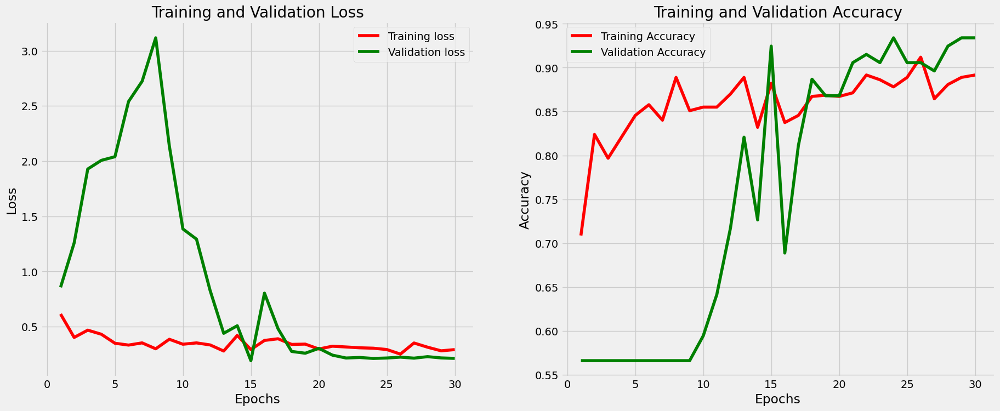

In [57]:
model_performance(history, epochs)

In [58]:
model_evaluation(cnn_model)

47/47 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - accuracy: 0.9470 - loss: 0.1531
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.9009 - loss: 0.2512
 5/14 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.9448 - loss: 0.1658

/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 148ms/step - accuracy: 0.9467 - loss: 0.1551
Train Loss:  0.16446423530578613
Train Accuracy:  0.9430894255638123
--------------------
Validation Loss:  0.21193350851535797
Validation Accuracy:  0.9339622855186462
--------------------
Test Loss:  0.15986579656600952
Test Accuracy:  0.9478672742843628


14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step


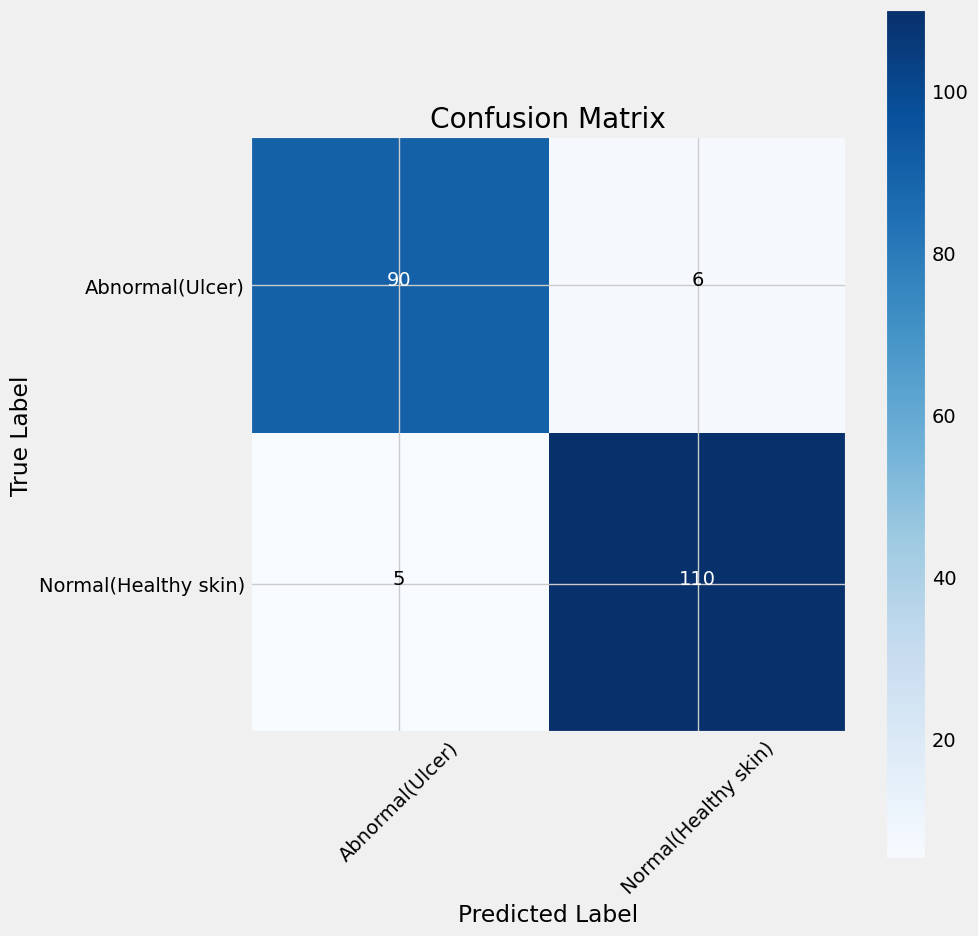

In [59]:
y_pred = get_pred(cnn_model, test_gen)

plot_confusion_matrix(test_gen, y_pred)

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


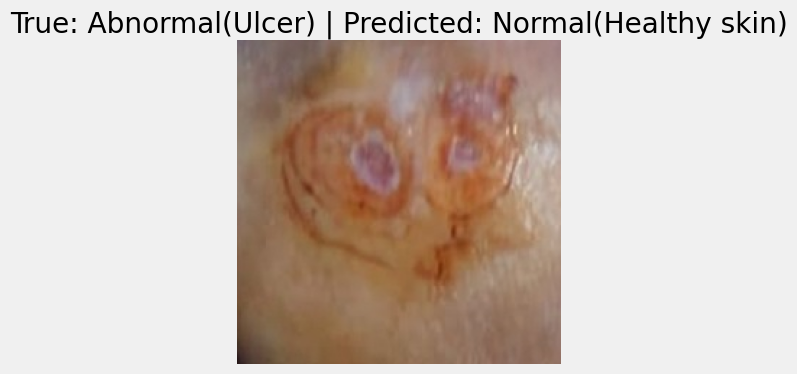

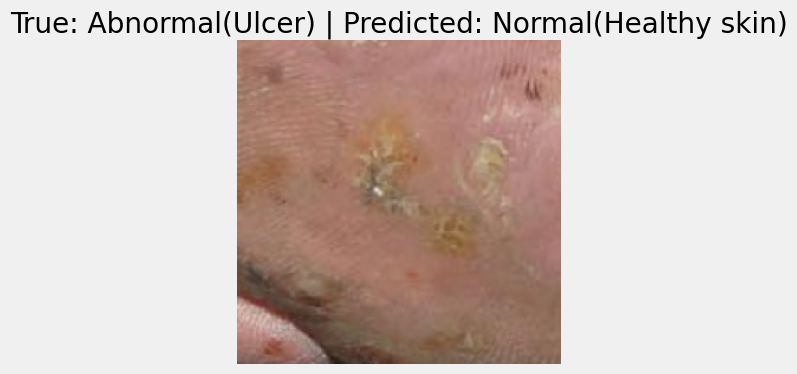

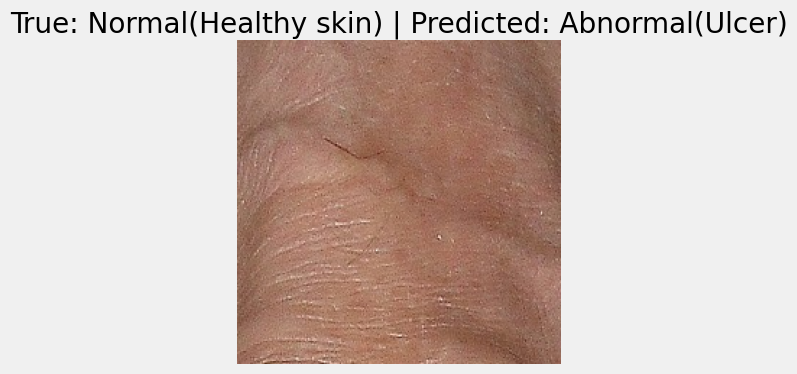

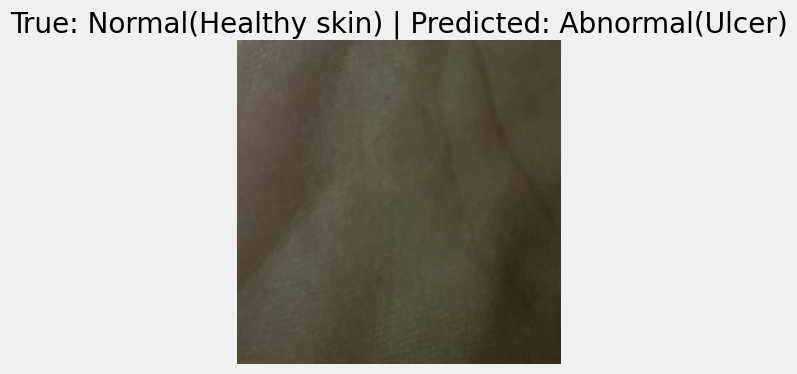

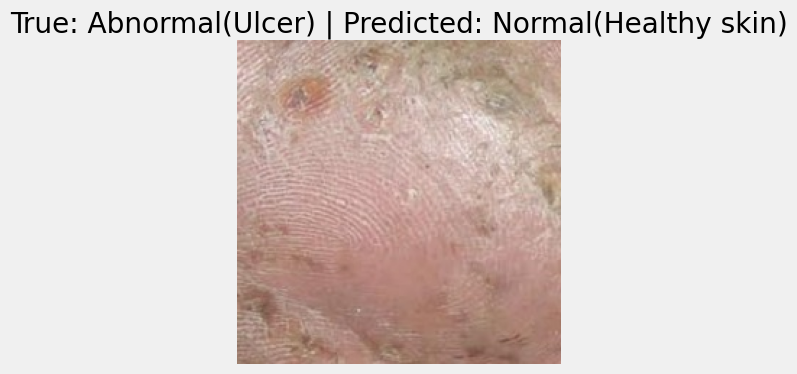

...

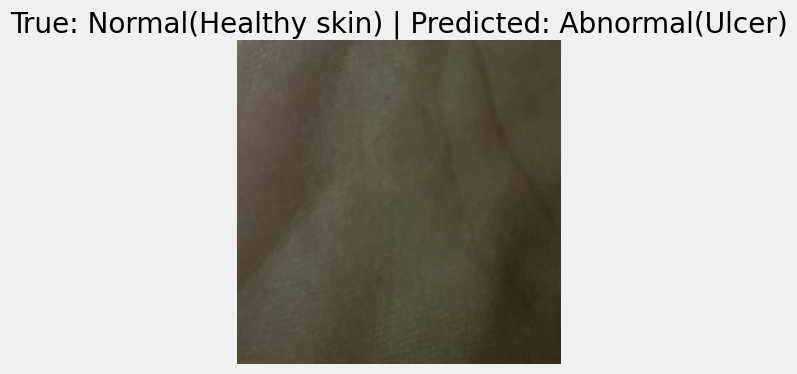

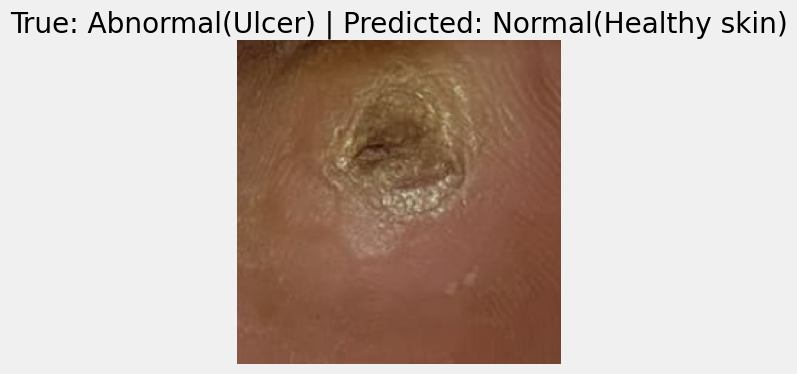

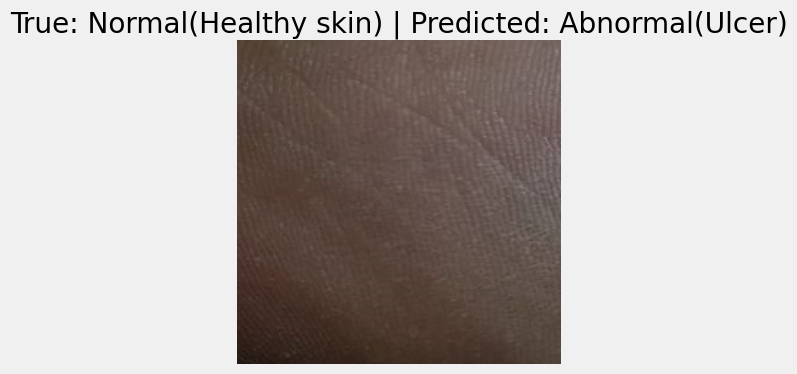

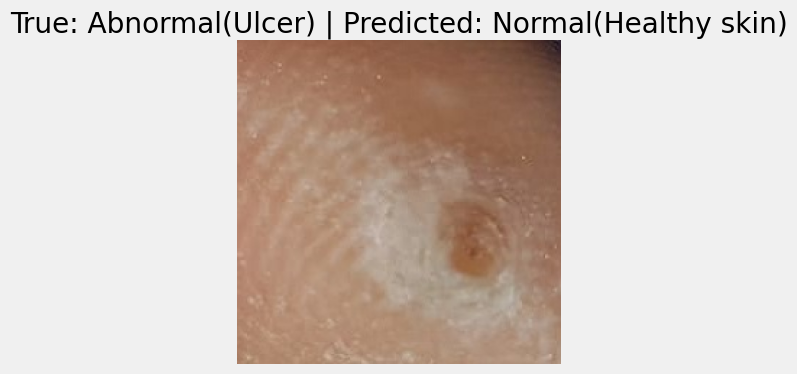

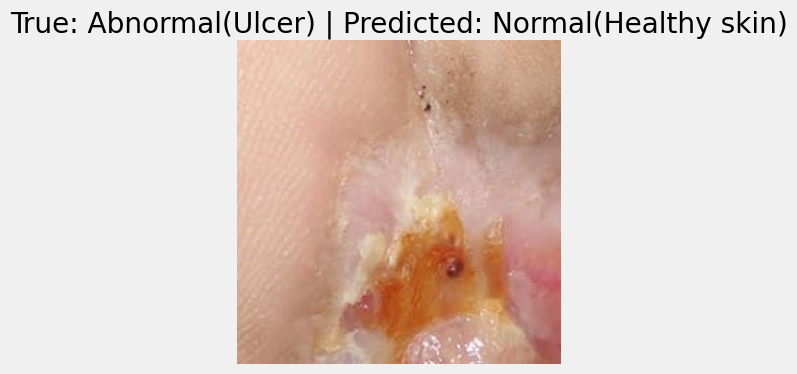

In [60]:
import numpy as np
import matplotlib.pyplot as plt

predictions = cnn_model.predict(test_gen)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = test_gen.classes

incorrect_indices = np.where(predicted_labels != true_labels)[0]

class_labels = list(test_gen.class_indices.keys())

for i in range(len(incorrect_indices)):
    idx = incorrect_indices[i]

    image = plt.imread(test_gen.filepaths[idx])
    true_label = class_labels[true_labels[idx]]
    predicted_label = class_labels[predicted_labels[idx]]

    plt.figure(figsize=(4, 4))
    plt.imshow(image)
    plt.title(f"True: {true_label} | Predicted: {predicted_label}")
    plt.axis('off')
    plt.show()


In [61]:
import os
import itertools

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras import layers, regularizers, Model

In [62]:
from tensorflow.keras.applications import VGG19
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.optimizers import Adam

base_model = VGG19(weights='imagenet', include_top=False, input_shape=img_shape)

for layer in base_model.layers:
    layer.trainable = False

for layer in base_model.layers[-3:]:  
    layer.trainable = True

vgg19_model = Sequential()
vgg19_model.add(base_model)
vgg19_model.add(GlobalAveragePooling2D())

vgg19_model.add(Dense(256, activation='relu'))
vgg19_model.add(Dense(128, activation='relu'))
vgg19_model.add(Dense(64, activation='relu'))
vgg19_model.add(Dense(32, activation='relu'))

vgg19_model.add(Dense(class_counts, activation='softmax'))

vgg19_model.compile(optimizer=Adam(learning_rate=1e-5),  
                    loss='categorical_crossentropy',
                    metrics=['accuracy'])

vgg19_model.build(input_shape=(None, 224, 224, 3))
vgg19_model.summary()


Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg19 (Functional)              │ (None, 7, 7, 512)      │    20,024,384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 2)              │            66 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 20,199,010 (77.05 MB)

 Trainable params: 4,894,242 (18.67 MB)

 Non-trainable params: 15,304,768 (58.38 MB)

In [63]:
epochs = 30   

history = vgg19_model.fit(train_gen, epochs= epochs, verbose= 1, validation_data=valid_gen)

Epoch 1/30
47/47 ━━━━━━━━━━━━━━━━━━━━ 19s 294ms/step - accuracy: 0.5247 - loss: 0.7027 - val_accuracy: 0.4340 - val_loss: 0.5578
Epoch 2/30
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 111ms/step - accuracy: 0.5542 - loss: 0.5010 - val_accuracy: 0.9245 - val_loss: 0.4011
Epoch 3/30
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 114ms/step - accuracy: 0.9461 - loss: 0.3560 - val_accuracy: 0.9811 - val_loss: 0.3267
Epoch 4/30
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 115ms/step - accuracy: 0.9363 - loss: 0.3179 - val_accuracy: 0.9811 - val_loss: 0.2640
Epoch 5/30
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - accuracy: 0.9448 - loss: 0.2570 - val_accuracy: 0.9811 - val_loss: 0.2005
Epoch 6/30
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - accuracy: 0.9701 - loss: 0.1811 - val_accuracy: 0.9811 - val_loss: 0.1422
Epoch 7/30
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 117ms/step - accuracy: 0.9833 - loss: 0.1298 - val_accuracy: 0.9811 - val_loss: 0.1139
Epoch 8/30
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 113ms/step - accuracy: 0.9667 - loss: 0.1199 - val_accuracy: 0

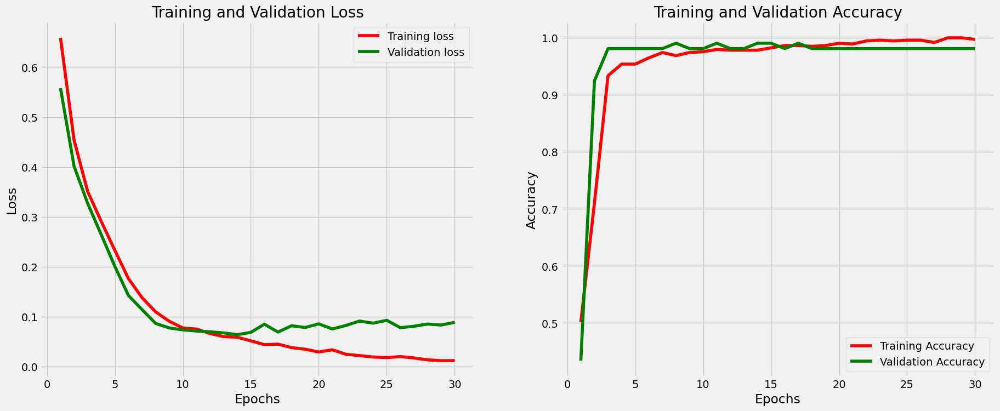

In [64]:
model_performance(history, epochs)

In [65]:
model_evaluation(vgg19_model)

47/47 ━━━━━━━━━━━━━━━━━━━━ 4s 94ms/step - accuracy: 1.0000 - loss: 0.0090
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - accuracy: 0.9733 - loss: 0.1553
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 328ms/step - accuracy: 0.9866 - loss: 0.0229
Train Loss:  0.009052767418324947
Train Accuracy:  1.0
--------------------
Validation Loss:  0.08847814798355103
Validation Accuracy:  0.9811320900917053
--------------------
Test Loss:  0.02304384671151638
Test Accuracy:  0.9905213117599487


14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step


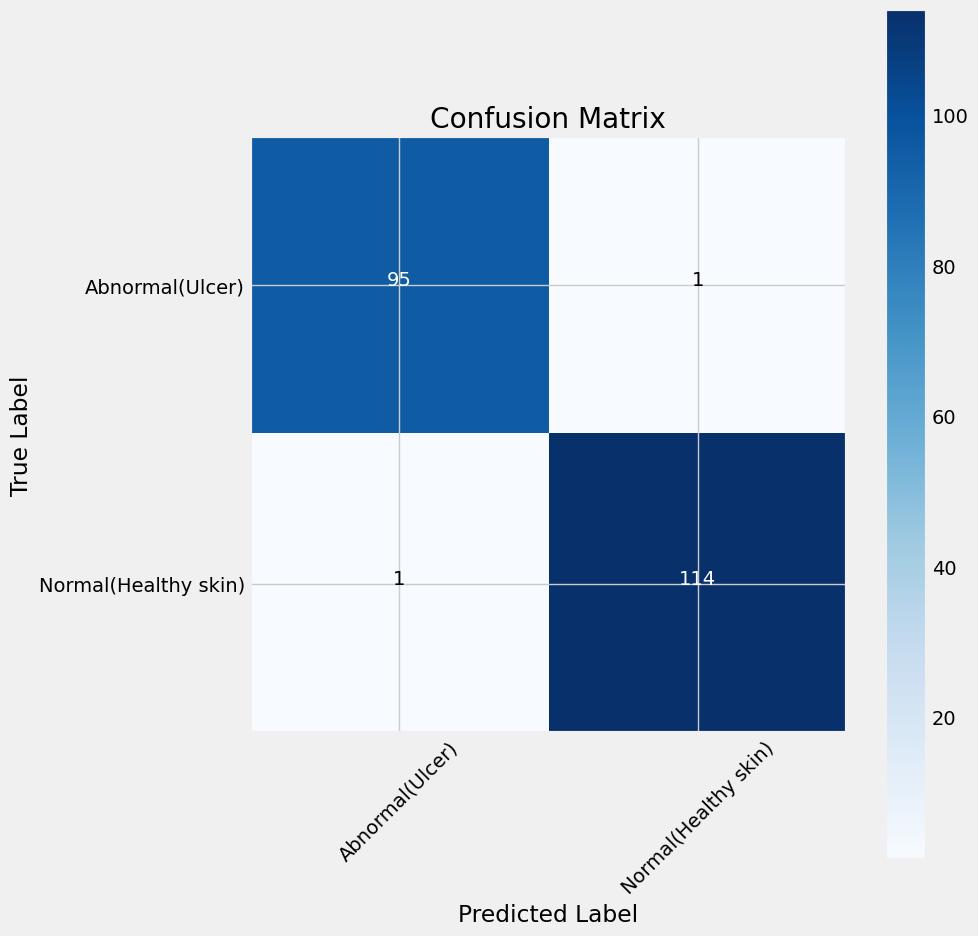

In [66]:
y_pred = get_pred(vgg19_model, test_gen)

plot_confusion_matrix(test_gen, y_pred)

14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step


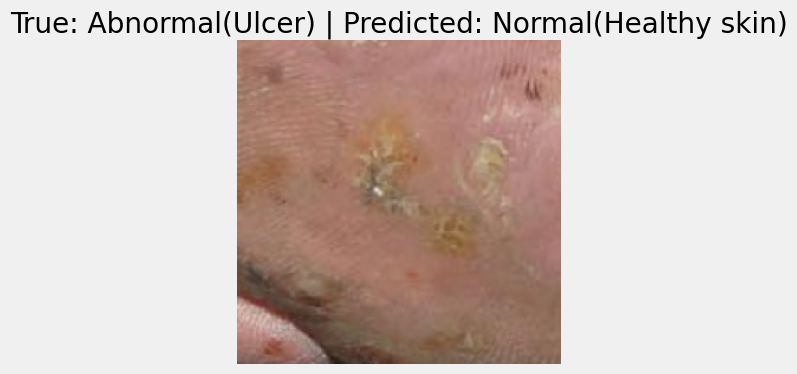

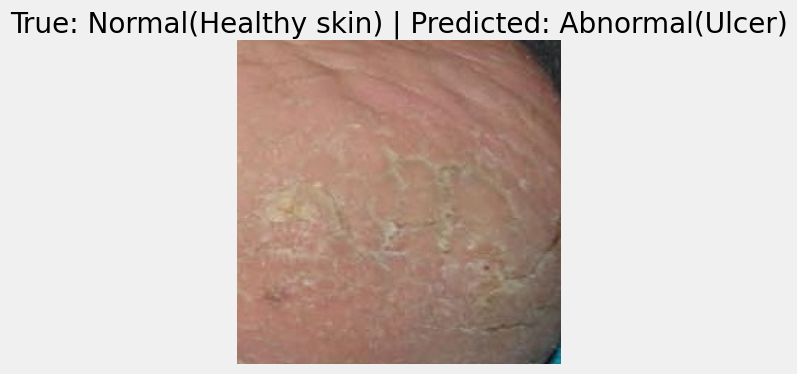

In [67]:
import numpy as np
import matplotlib.pyplot as plt

predictions = vgg19_model.predict(test_gen)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = test_gen.classes

incorrect_indices = np.where(predicted_labels != true_labels)[0]

class_labels = list(test_gen.class_indices.keys())

for i in range(len(incorrect_indices)):
    idx = incorrect_indices[i]

    image = plt.imread(test_gen.filepaths[idx])
    true_label = class_labels[true_labels[idx]]
    predicted_label = class_labels[predicted_labels[idx]]

    plt.figure(figsize=(4, 4))
    plt.imshow(image)
    plt.title(f"True: {true_label} | Predicted: {predicted_label}")
    plt.axis('off')
    plt.show()


In [68]:
model_name='EfficientNetB3'
base_model=tf.keras.applications.EfficientNetB2(include_top=False, weights="imagenet",input_shape=(224, 224, 3), pooling='max')

for layer in base_model.layers:
    layer.trainable = True

x=base_model.output
x=keras.layers.BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001 )(x)
x = Dense(256, kernel_regularizer = regularizers.l2(0.016),activity_regularizer=regularizers.l1(0.006),
                bias_regularizer=regularizers.l1(0.006) ,activation='relu')(x)
x=Dropout(rate=.5, seed=123)(x)   
num_classes = len(train_gen.class_indices)
output=Dense(num_classes, activation='softmax')(x)
model=Model(inputs=base_model.input, outputs=output)
model.compile(Adamax(learning_rate=.001), loss='categorical_crossentropy', metrics=['accuracy']) 

In [69]:
epochs = 30   

history = model.fit(train_gen, epochs= epochs, verbose= 1, validation_data=valid_gen)

Epoch 1/30
47/47 ━━━━━━━━━━━━━━━━━━━━ 180s 2s/step - accuracy: 0.8025 - loss: 17.6544 - val_accuracy: 0.5660 - val_loss: 28.4426
Epoch 2/30
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - accuracy: 0.8578 - loss: 7.9476 - val_accuracy: 0.5660 - val_loss: 9.0736
Epoch 3/30
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - accuracy: 0.8711 - loss: 6.2997 - val_accuracy: 0.5660 - val_loss: 6.6872
Epoch 4/30
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 111ms/step - accuracy: 0.8538 - loss: 5.8966 - val_accuracy: 0.5660 - val_loss: 5.9970
Epoch 5/30
47/47 ━━━━━━━━━━━━━━━━━━━━ 5s 111ms/step - accuracy: 0.8867 - loss: 5.4992 - val_accuracy: 0.5566 - val_loss: 12.2153
Epoch 6/30
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 113ms/step - accuracy: 0.8319 - loss: 5.1621 - val_accuracy: 0.5849 - val_loss: 9.2293
Epoch 7/30
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 114ms/step - accuracy: 0.8676 - loss: 4.8263 - val_accuracy: 0.5660 - val_loss: 11.1220
Epoch 8/30
47/47 ━━━━━━━━━━━━━━━━━━━━ 6s 114ms/step - accuracy: 0.8707 - loss: 4.5752 - val_accuracy:

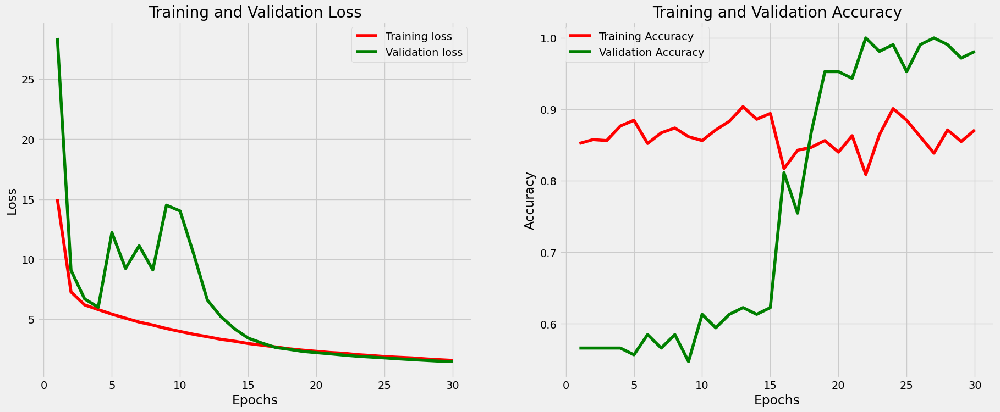

In [70]:
model_performance(history, epochs)

In [71]:
model_evaluation(model)

47/47 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - accuracy: 0.9749 - loss: 1.4715
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - accuracy: 0.9866 - loss: 1.4781
14/14 ━━━━━━━━━━━━━━━━━━━━ 5s 393ms/step - accuracy: 0.9885 - loss: 1.4700
Train Loss:  1.4711356163024902
Train Accuracy:  0.9674796462059021
--------------------
Validation Loss:  1.4703327417373657
Validation Accuracy:  0.9811320900917053
--------------------
Test Loss:  1.4712245464324951
Test Accuracy:  0.9763033390045166


14/14 ━━━━━━━━━━━━━━━━━━━━ 11s 478ms/step


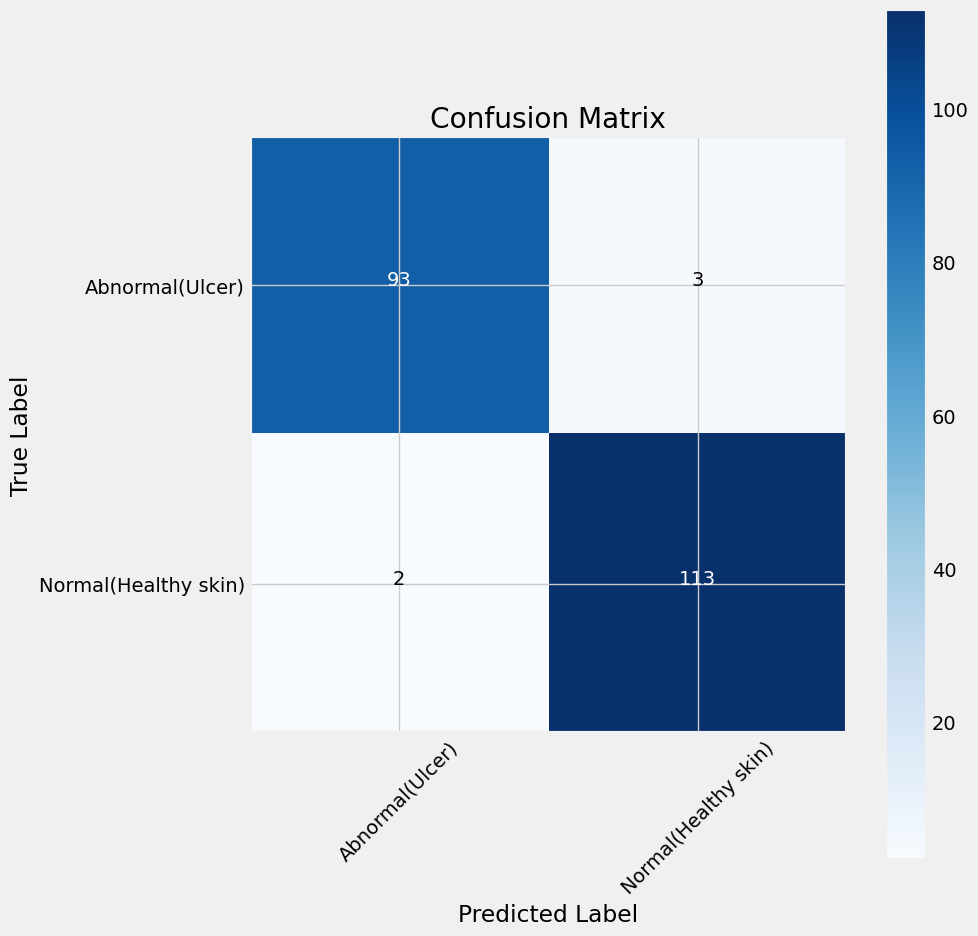

In [72]:
y_pred = get_pred(model, test_gen)

plot_confusion_matrix(test_gen, y_pred)

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


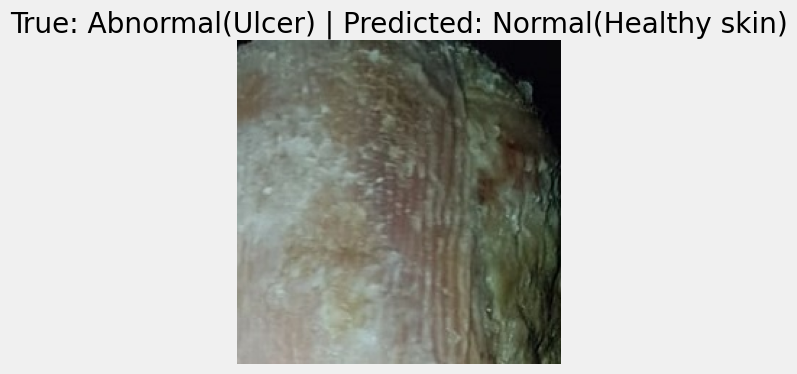

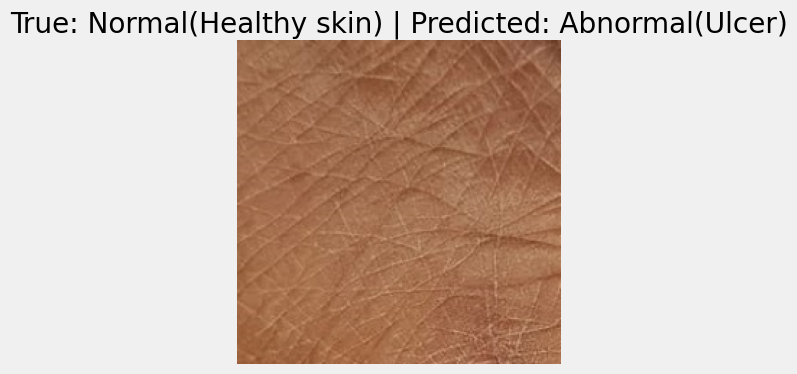

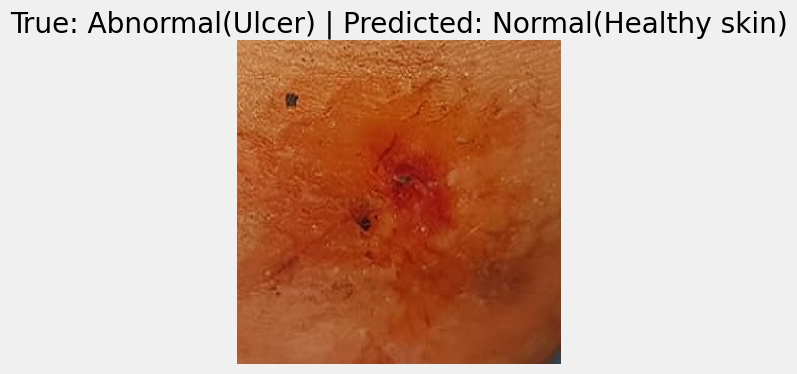

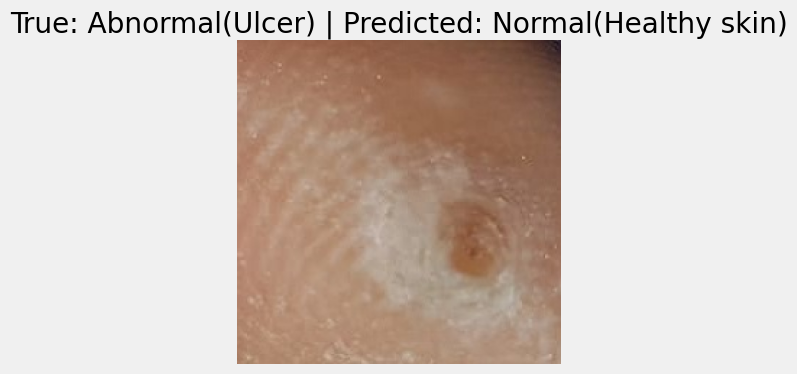

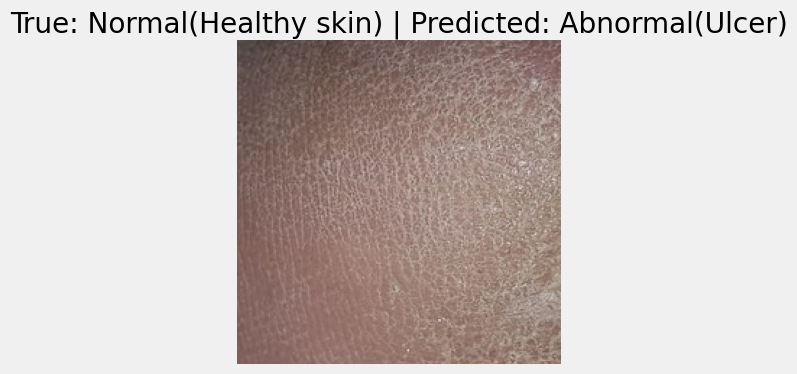

In [73]:
import numpy as np
import matplotlib.pyplot as plt

predictions = model.predict(test_gen)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = test_gen.classes

incorrect_indices = np.where(predicted_labels != true_labels)[0]

class_labels = list(test_gen.class_indices.keys())

for i in range(len(incorrect_indices)):
    idx = incorrect_indices[i]

    image = plt.imread(test_gen.filepaths[idx])
    true_label = class_labels[true_labels[idx]]
    predicted_label = class_labels[predicted_labels[idx]]

    plt.figure(figsize=(4, 4))
    plt.imshow(image)
    plt.title(f"True: {true_label} | Predicted: {predicted_label}")
    plt.axis('off')
    plt.show()

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 638ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━

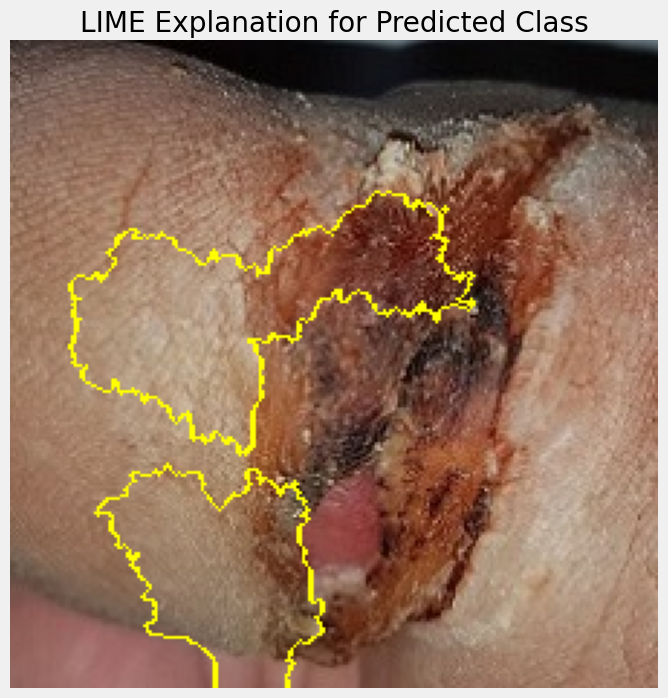

In [74]:
from lime import lime_image
from skimage.segmentation import mark_boundaries
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
# from google.colab import files

explainer = lime_image.LimeImageExplainer()

def explain_with_lime(model, image, class_names):

    def predict(images):
        images = np.stack([np.array(img) for img in images])
        preds = model.predict(images)
        return preds

    explanation = explainer.explain_instance(image, predict, top_labels=2, hide_color=0, num_samples=1000)

    temp, mask = explanation.get_image_and_mask(explanation.top_labels[1], positive_only=True, num_features=5, hide_rest=False)
    img_boundaries = mark_boundaries(temp, mask)

    return explanation, img_boundaries

image_url = "/kaggle/input/diabetic-foot-ulcer-dfu/DFU/Patches/Abnormal(Ulcer)/10.jpg"
img = Image.open(image_url)


img = img.resize((224, 224))
img = img.convert('RGB')
image = np.array(img) / 255.0

class_names = ['Abnormal','Normal']

explanation, img_boundaries = explain_with_lime(cnn_model, image, classes)

plt.figure(figsize=(8, 8))
plt.imshow(img_boundaries)
plt.title("LIME Explanation for Predicted Class")
plt.axis('off')
plt.show()

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━

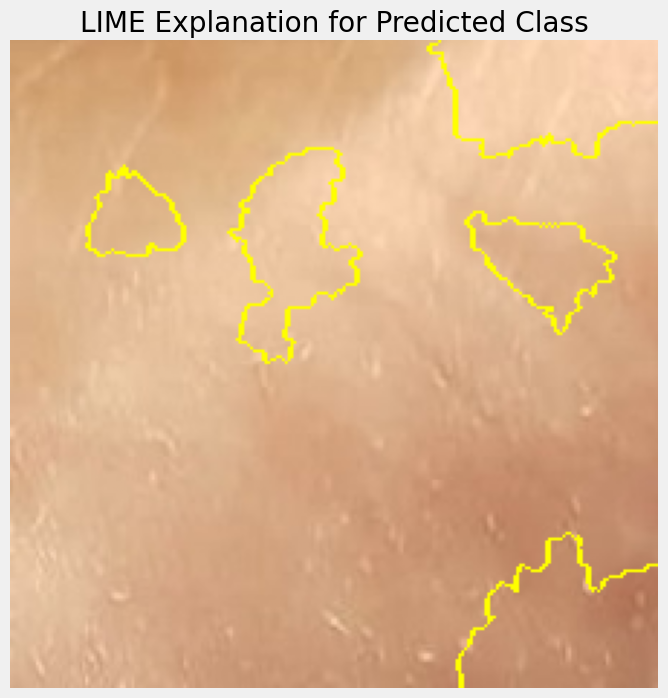

In [78]:
from lime import lime_image
from skimage.segmentation import mark_boundaries
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
# from google.colab import files

explainer = lime_image.LimeImageExplainer()

def explain_with_lime(model, image, class_names):

    def predict(images):
        images = np.stack([np.array(img) for img in images])
        preds = model.predict(images)
        return preds

    explanation = explainer.explain_instance(image, predict, top_labels=2, hide_color=0, num_samples=1000)

    temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=False)
    img_boundaries = mark_boundaries(temp, mask)

    return explanation, img_boundaries

image_url = "/kaggle/input/diabetic-foot-ulcer-dfu/DFU/Patches/Normal(Healthy skin)/105.jpg"
img = Image.open(image_url)


img = img.resize((224, 224))
img = img.convert('RGB')
image = np.array(img) / 255.0

class_names = ['Abnormal','Normal']

explanation, img_boundaries = explain_with_lime(cnn_model, image, classes)

plt.figure(figsize=(8, 8))
plt.imshow(img_boundaries)
plt.title("LIME Explanation for Predicted Class")
plt.axis('off')
plt.show()

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━

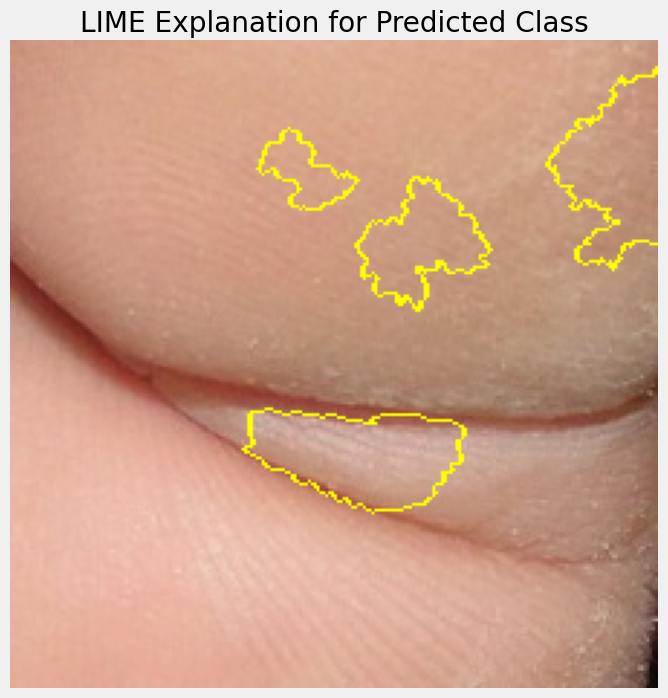

In [77]:
from lime import lime_image
from skimage.segmentation import mark_boundaries
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
# from google.colab import files

explainer = lime_image.LimeImageExplainer()

def explain_with_lime(model, image, class_names):

    def predict(images):
        images = np.stack([np.array(img) for img in images])
        preds = model.predict(images)
        return preds

    explanation = explainer.explain_instance(image, predict, top_labels=2, hide_color=0, num_samples=1000)

    temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=False)
    img_boundaries = mark_boundaries(temp, mask)

    return explanation, img_boundaries

image_url = "/kaggle/input/diabetic-foot-ulcer-dfu/DFU/Patches/Normal(Healthy skin)/1.jpg"
img = Image.open(image_url)


img = img.resize((224, 224))
img = img.convert('RGB')

image = np.array(img) / 255.0

class_names = ['Abnormal','Normal']

explanation, img_boundaries = explain_with_lime(cnn_model, image, classes)

plt.figure(figsize=(8, 8))
plt.imshow(img_boundaries)
plt.title("LIME Explanation for Predicted Class")
plt.axis('off')
plt.show()